# Baseline Kinematics

Get all bouts (forward/backward) for non implanted mice and quantify kinematics. 

Start by plotting the whole tracks over the arena.
Plot heatmaps of kinematic variables over the entire track.
Plot histograms of distributions of the kinematics variables.

In [9]:
include("settings.jl");

  Activating project at `~/Documents/Github/LocomotionControl`


### Get data
Use PyCall to get locomotion bouts data from the database

In [2]:
out_bouts = convert(DataFrame, py"get_bouts('outbound')");
in_bouts = convert(DataFrame, py"get_bouts('inbound')");


## Full trace plots

Plot the traces for each bout

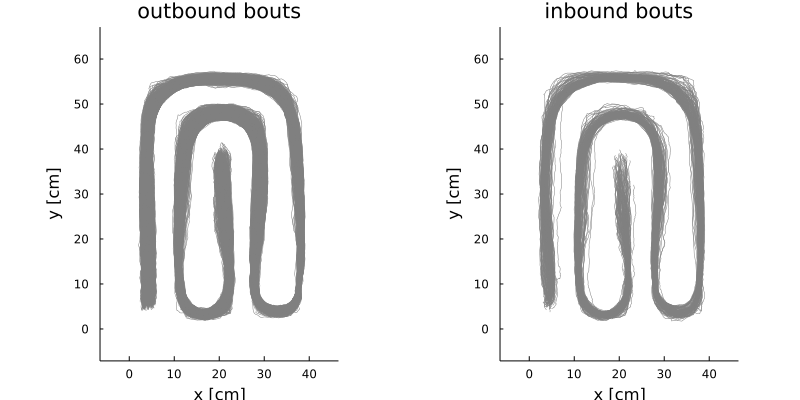

In [3]:
out_bouts_plot = plot_bouts_trace(out_bouts; title="outbound bouts", alpha=.5)
in_bouts_plot = plot_bouts_trace(in_bouts; title="inbound bouts", alpha=.5)
plot(out_bouts_plot, in_bouts_plot, layout=(1, 2), size=(800, 400))


Plot kinematics heatmaps

In [4]:
X_out, Y_out, S_out, A_out, T_out, D_out = stack_kinematic_variables(out_bouts)
X_in, Y_in, S_in, A_in, T_in, D_in = stack_kinematic_variables(in_bouts);

outbound


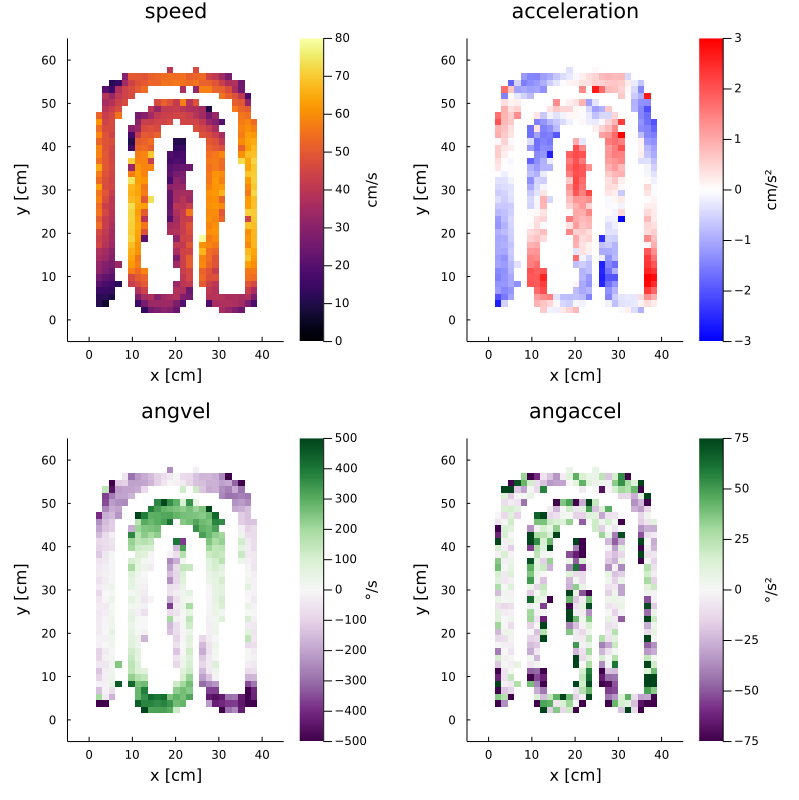

In [10]:
println("outbound")
kinematics_heatmaps(X_out, Y_out, S_out, A_out, T_out, D_out; stepsize=1.5)


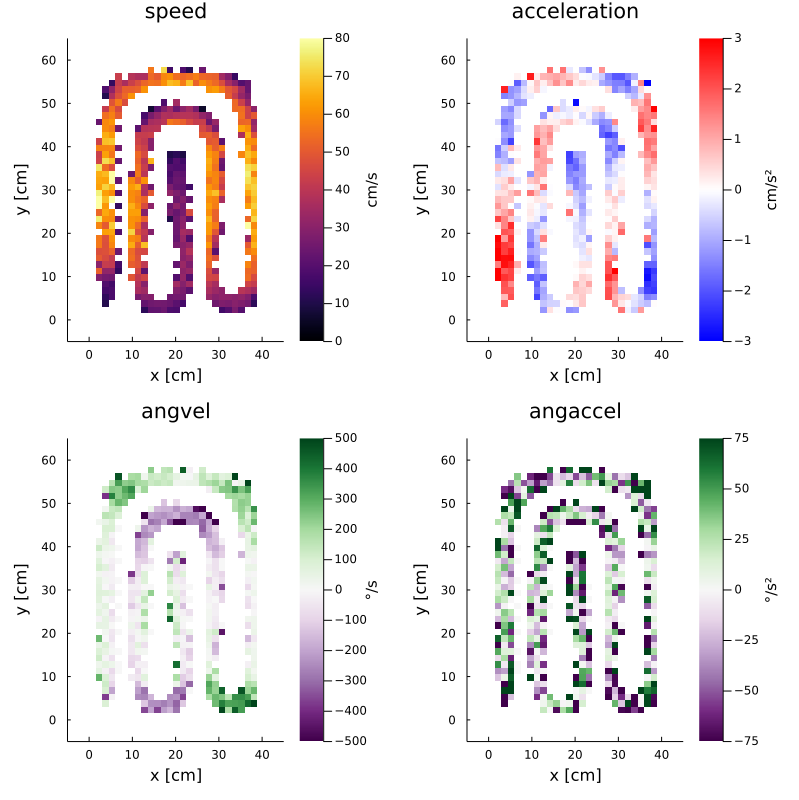

inbound


In [11]:
println("inbound")
kinematics_heatmaps(X_in, Y_in, S_in, A_in, T_in, D_in; stepsize=1.5) |> display

### Kinematics Histograms

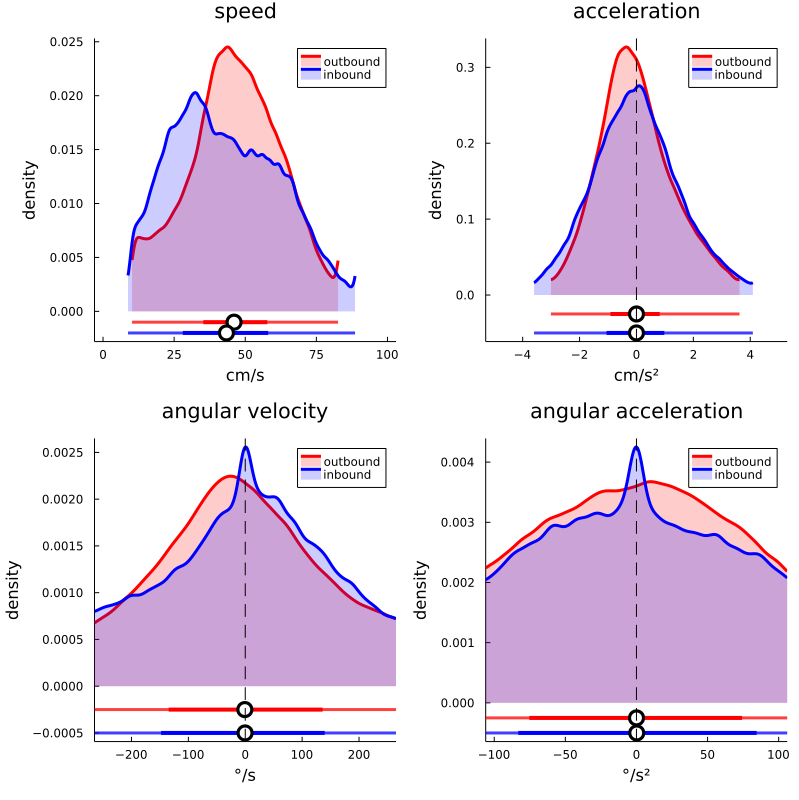

In [46]:
h1 = plot_density(S_out; title="speed", color=:red, alpha=1, lw=3, 
    bandwidth = 1, y=-0.001,
    label="outbound", ylabel="density", xlabel="cm/s", xlim=[0, 100])
plot_density!(h1, S_in; color=:blue, alpha=1, lw=3, label="inbound", bandwidth = 1, y=-0.002)

h2 = plot_density(A_out, title="acceleration", color=:red, alpha=1, lw=3, 
    bandwidth = 0.1,  y=-0.025,
    label="outbound", ylabel="density", xlabel="cm/s²", xlim=[-5, 5])
plot_density!(h2, A_in, color=:blue, alpha=1, lw=3,  label="inbound", bandwidth = 0.1, y=-0.05)
vline!(h2, [0], color=:black, lw=1, label="", linestyle=:dash)

h3 = plot_density(T_out, title="angular velocity", color=:red, alpha=1, lw=3, 
    bandwidth = 10, y=-0.00025,
    label="outbound", ylabel="density", xlabel="°/s", xlim=[-250, 250])
plot_density!(h3, T_in, color=:blue, alpha=1, lw=3,  label="inbound", bandwidth = 10, y=-0.0005)
vline!(h3, [0], color=:black, lw=1, label="", linestyle=:dash)

h4 = plot_density(D_out, title="angular acceleration", color=:red, alpha=1, lw=3, 
    bandwidth = 5, y=-0.00025,
    label="outbound", ylabel="density", xlabel="°/s²", xlim=[-100, 100])
plot_density!(h4, D_in, color=:blue, alpha=1, lw=3,  label="inbound", bandwidth = 5,  y=-0.0005)
vline!(h4, [0], color=:black, lw=1, label="", linestyle=:dash)

plot(h1, h2, h3, h4, layout=(2, 2), size=(800, 800))